<a href="https://colab.research.google.com/github/mlaiclass/homework/blob/main/Breast_Cancer_HW1_Logistic_Regression_Implementation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

 **Task 1 (10 points): Describe a machine learning problem that you would like to solve using 
Logistic Regression. Clearly state why Logistic regression is the best choice for solving this problem.**

The machine learning problem that you would like to solve using 
Logistic Regression is predicting the risk of breast cancer. Logistic regression is the best choice for solving this problem because the dependent variable is binary (breast cancer exists or breast cancer does not exist. Logistic regression will help us determine the probabilities between 2 classes, and through the EDA process, I found that the dataset is linearly separable.



**2 (20 points): Pick a publicly available dataset (except The Titanic Dataset because we 
already discussed that in class) that you will use to solve this problem. You must provide a link 
to the dataset and perform necessary Exploratory Data Analysis (EDA). Clearly demonstrate the 
steps you follow for your EDA with a justification of why these were required. For example, if 
the dataset has lot of missing values, then why did you use a specific technique when handling 
missing data. This task may include data visualization (Check this link : 
https://www.geeksforgeeks.org/top-8-python-libraries-for-data-visualization/).**

In [ ]:
import pandas as pd
import numpy as np
import sklearn
import matplotlib
import seaborn as sns

In [ ]:
# Import sklearn breast cancer data set.
from sklearn.datasets import load_breast_cancer 
# This dataset includes detailed measurements for breast cancer recorded by the University of Wisconsin Hospitals.
# Load breast_cancer data.
breast_cancer = load_breast_cancer()
# Create data frames.
breast_cancer_df = pd.DataFrame(data= breast_cancer.data, columns= breast_cancer.feature_names)
print(breast_cancer_df)

In [ ]:
target_df = pd.DataFrame(data= breast_cancer.target, columns= ['species'])
def converter(specie):
    if specie == 0:
        return 'radius'
    elif specie == 1:
        return 'diameter'
    else:
        return 'width'
target_df['species'] = target_df['species'].apply(converter)

# Concat the data frames.
breast_cancer_df = pd.concat([breast_cancer_df, target_df], axis= 1)

# View an overview of the dataset.
breast_cancer_df.describe()

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst radius,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension
count,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,...,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000
mean,14.127292,19.289649,91.969033,654.889104,0.096360,0.104341,0.088799,0.048919,0.181162,0.062798,...,16.269190,25.677223,107.261213,880.583128,0.132369,0.254265,0.272188,0.114606,0.290076,0.083946
std,3.524049,4.301036,24.298981,351.914129,0.014064,0.052813,0.079720,0.038803,0.027414,0.007060,...,4.833242,6.146258,33.602542,569.356993,0.022832,0.157336,0.208624,0.065732,0.061867,0.018061
min,6.981000,9.710000,43.790000,143.500000,0.052630,0.019380,0.000000,0.000000,0.106000,0.049960,...,7.930000,12.020000,50.410000,185.200000,0.071170,0.027290,0.000000,0.000000,0.156500,0.055040
25%,11.700000,16.170000,75.170000,420.300000,0.086370,0.064920,0.029560,0.020310,0.161900,0.057700,...,13.010000,21.080000,84.110000,515.300000,0.116600,0.147200,0.114500,0.064930,0.250400,0.071460
50%,13.370000,18.840000,86.240000,551.100000,0.095870,0.092630,0.061540,0.033500,0.179200,0.061540,...,14.970000,25.410000,97.660000,686.500000,0.131300,0.211900,0.226700,0.099930,0.282200,0.080040
75%,15.780000,21.800000,104.100000,782.700000,0.105300,0.130400,0.130700,0.074000,0.195700,0.066120,...,18.790000,29.720000,125.400000,1084.000000,0.146000,0.339100,0.382900,0.161400,0.317900,0.092080
max,28.110000,39.280000,188.500000,2501.000000,0.163400,0.345400,0.426800,0.201200,0.304000,0.097440,...,36.040000,49.540000,251.200000,4254.000000,0.222600,1.058000,1.252000,0.291000,0.663800,0.207500


In [ ]:
# View dataset info.
breast_cancer_df.info()

KeyboardInterrupt: ignored

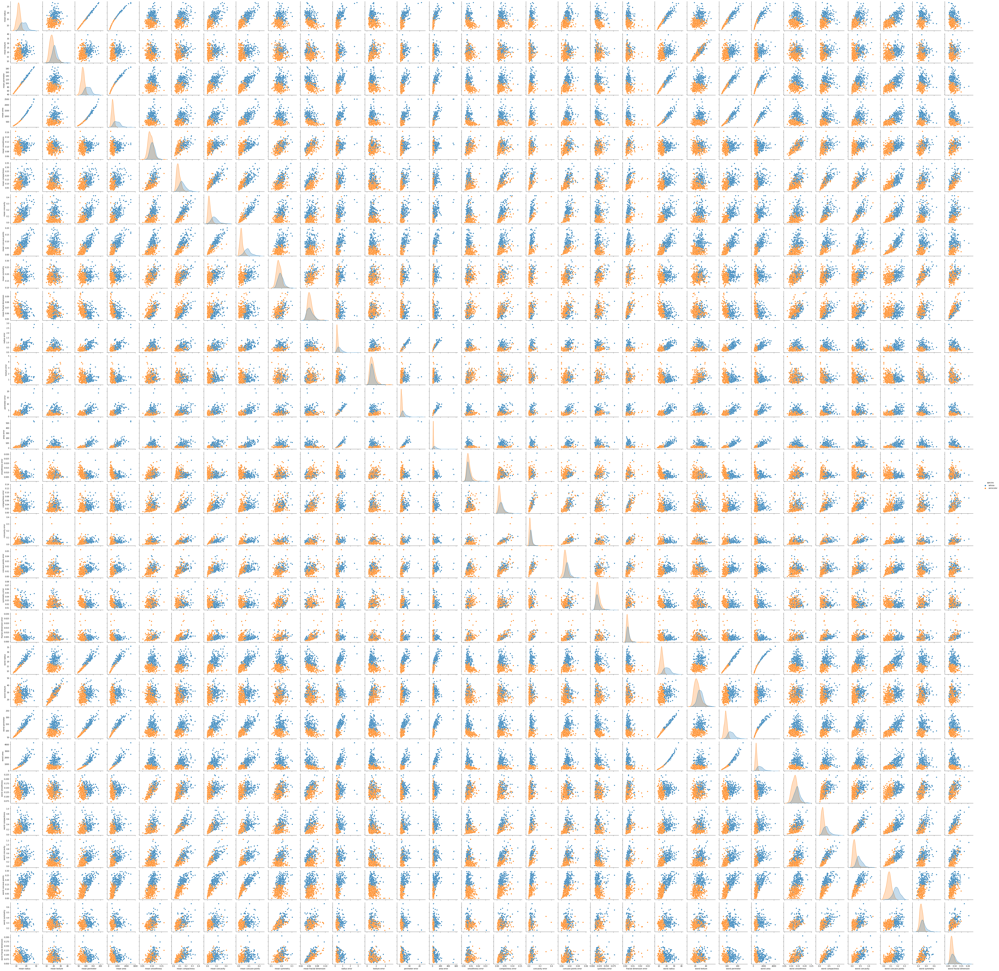

In [ ]:
sns.pairplot(breast_cancer_df, hue= 'species')

**3 (35 points): Implement, Logistic Regression in this step. Clearly write your cost function 
and derivatives before implementing gradient descent. Do not use any built-in packages for this 
step. You can use the vectorization techniques demonstrated in class. Implement any 2 variants 
of gradient descent in their original form. (Refer to the research paper discussed in class).** 

In [ ]:
'''
Notes to Self:
Start to implement logisitc regression without any built-in packages.
Write cost function and derivatives before implementing gradient descent.
Cost function we would like to minimize (this is the mean squared errors function):
Identify parameters in the regression function.
Use vectorization techniques demonstrated in class.
Implement 2 variants of gradient descent in its original form.
'''

In [ ]:
# Variant #1 of gradient descent: batch gradient descent.
# Computes the gradient of the cost function for the entire training dataset.
'''
Source: Pseudocode from Textbook
for i in range (nb_epochs):
  params_grad = evaluate_gradient(loss_function, data, params)
  # learning rate is the rate at which we update parameters with each iteration in the process of minimizing the MSE
  params = params - learning_rate * params_grad
'''
from sklearn.metrics import mean_squared_error
import numpy as np
def GradientDescent(x, y, learning_rate=0.025, epoch=15):
    # I've set the learning rate to .025 in this implementation.  I've set the number of epochs to 15. You can change it to meet the needs of the problem you aim to solve. 
    m, b = 0.3, 0.3
    log, mean_square_error = [], [] # lists to store learning process
    n = len(x) # number of samples
    for _ in range(epoch):        
        function = y - (m*x + b)
        b -= learning_rate * (-2 * function.sum() / n)
        m -= learning_rate * (-2 * x.dot(function).sum() / n)
        log.append((m, b))
        mean_square_error.append(mean_squared_error(y, (m*x + b)))        
    return m, b, log, mean_square_error

In [ ]:
# Variant #2 of gradient descent: stochastic gradient descent.
# Performs a parameters update for each training example.
''' 
Source: Pseudocode from Textbook
for i in range(nb_epochs):
  np.random.shuffle(data):
  for example in data:
    params_grad = evaluate_gradient(loss_function, example, params)
    params = params - learning_rate * params_grad
'''
def StochasticGradientDescent(x, y, learning_rate=0.025, epoch=15, batch_size=1):
    # I've set the learning rate to .025 in this implementation.  I've set the number of epochs to 15. You can change it to meet the needs of the problem you aim to solve.
    log, mean_square_error = [], [] # lists to store learning process
    m, b = 0.3, 0.3
    for _ in range(epoch):
        i = np.random.randint(0, len(x), batch_size) # create a random sample
        y_ = np.take(y, i)
        X_ = np.take(X, i)
        n = len(X_)
        function = y_ - (m*X_ + b)
        # Updating parameters m and b
        b -= learning_rate * (function.sum() * -2 / n)
        m -= learning_rate * (X_.dot(function).sum() * -2 / n)
        log.append((m, b))
        mean_square_error.append(mean_squared_error(y, m*x+b))        
    return m, b, log, mean_square_error

In [ ]:
#Assuming you have a custom sigmoid function (Source: from Prof. Mushtaque's lecture notes)
#A = sigmoid(np.dot(w.T,X) + b)
#cost=-1/m * np.sum(Y * np.log(A) + (1-Y) * (np.log(1-A)))
#dw = np.dot(X, (A-Y).T)/n
#db= np.sum(A-Y)/n

#You basically need to write down two steps and iterate through them for the entire dataset:
# 1) Calculate the cost and the gradient for the current parameters.
# 2) Update the parameters using gradient descent rule for w and b.
#w = w - learning_rate*dw
#b= b - learning_rate*db

**4 (35 points): Pick any 2 optimization algorithms that are used to optimize the ‘vanilla’
gradient descent. Implement both. You may implement these algorithms yourself OR use a 
package. In your conclusion, compare both optimization techniques/algorithms with respect to 
the results you achieve. Also compare these results with the original implementation of 
gradient descent (Task 3 above). Describe why or why not should we use optimization 
algorithms for the task at hand.** 

In [ ]:
'''
Question: Describe why or why not should we use optimization 
algorithms for the task at hand.

Answer: We should optimization algorithms for this problem because SGD has been shown to be
helpful for learning linear classifiers and has been successfully applied to large-scale datasets, which the breast 
cancer dataset is. For these reasons using a optimizers for this problem is wise, and I've used them in this homework.
'''

#This is the 'vanilla' gradient I will optimize.
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
breast_cancer_df.drop('species', axis= 1, inplace= True)
target_df = pd.DataFrame(columns= ['species'], data= breast_cancer.target)
breast_cancer_df = pd.concat([breast_cancer_df, target_df], axis= 1)

# Set variables
X= breast_cancer_df.drop(labels= 'mean radius', axis= 1)
y= breast_cancer_df['mean radius']

# Split data set 
Xtrain, Xtest, ytrain, ytest = sklearn.model_selection.train_test_split(X, y, random_state= 80, test_size= 0.5)

# Create, train, and fit model
linear_regression = LinearRegression()
linear_regression.fit(Xtrain, ytrain)

# Make prediction
linear_regression.predict(Xtest)
pred = linear_regression.predict(Xtest)

In [ ]:
'''
"Stochastic Gradient Descent (SGD) is a simple yet efficient optimization algorithm used to find the values of 
parameters/coefficients of functions that minimize a cost function. In other words, it is used for discriminative 
learning of linear classifiers under convex loss functions such as SVM and Logistic regression. It has been successfully 
applied to large-scale datasets because the update to the coefficients is performed for each training instance, 
rather than at the end of instances."
'''
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import SGDClassifier
from sklearn import linear_model

SGDClf = linear_model.SGDClassifier(max_iter = 10000, tol=1e-4,penalty = "elasticnet")
y_train = ytrain[:, 1]
SGDClf.fit(Xtrain, y_train)
SGDClf.predict([[2.,2.]])